Vamos utilizar o método Implícito para resolver a equação do calor, para condição inicial sen(x).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [3]:
from scipy.sparse import diags

def mat_tridiag(nx, dx):
    """
    Constroi a matriz tridiagonal para calcular a segunda derivada discreta
    Parametros
    ----------
    nx : int
        Numero de pontos na barra
    dx : float
        Espacamento entre os pontos
    Return : numpy.ndarray
        matriz para computar a segunda derivada discreta
    """
    diagonais = [[1.], [-2.], [1.]]

    offsets = [-1, 0, 1] # diagonais acima, na diagonal, abaixo

    d2mat = diags(diagonais, offsets, shape=(nx-2,nx-2)).toarray() # matriz tridiagonal

    return d2mat / dx**2 # matriz tridiagonal dividida pelo quadrado do espacamento

In [17]:

# Parâmetros
alpha = 0.05                   # coeficiente de difusão
lx = 1.                        # tamanho da barra em x
ti = 0.0                       # tempo inicial
tf = 7.0                       # tempo final

# Discretização
nx = 513                       # número de pontos na barra
dx = lx / (nx-1)               # espaço entre os pontos
x = np.linspace(0., lx, nx)    # coordenadas dos pontos


T0 = 40*np.sin(3*np.pi*x)              # condição inicial

# matriz d^2 / dx^2 
D2 = mat_tridiag(nx, dx)

fourier = 10              # número de termos da série de Fourier
dt = fourier*dx**2/alpha  # passo de tempo
nt = int((tf-ti)/dt)      # número de passos de tempo

# I-A matrix
M = np.eye(nx-2) - alpha*dt*D2
Minv = np.linalg.inv(M)

T = np.empty((nt+1, nx)) # array para armazenar a solução    
T[0] = T0.copy()         # coloca a condição inicial no array

T[:,0] = 0
T[:,-1] = 0

for i in range(nt):
    T[i+1, 1:-1] = np.dot(Minv, T[i, 1:-1])

print(T.round(2))

[[0.   0.74 1.47 ... 1.47 0.74 0.  ]
 [0.   0.73 1.47 ... 1.47 0.73 0.  ]
 [0.   0.73 1.46 ... 1.46 0.73 0.  ]
 ...
 [0.   0.   0.   ... 0.   0.   0.  ]
 [0.   0.   0.   ... 0.   0.   0.  ]
 [0.   0.   0.   ... 0.   0.   0.  ]]


Terminada a criação do array T pode fazer uma Animação.

Começando pela linha 0 da matriz T, criamos uma função de atualização para percorrer as linhas da coluna

Text(0.5, 1.0, 'Dissipação de Calor numa Barra')

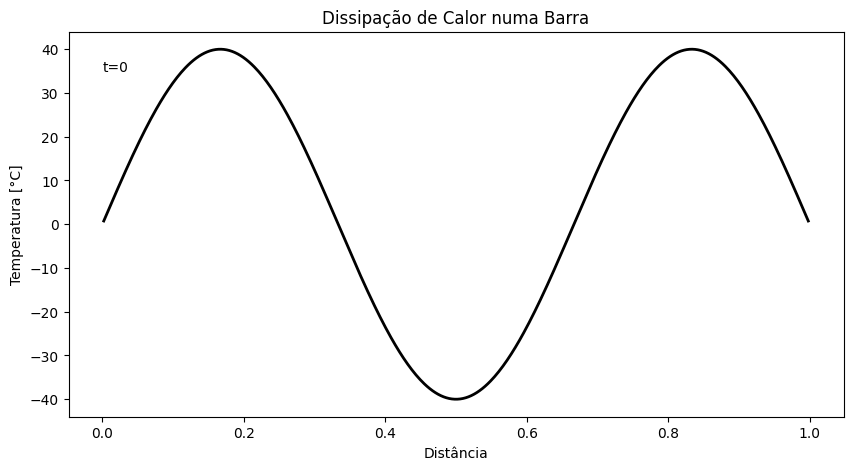

In [18]:

fig, ax = plt.subplots(figsize=(10, 5))

line, = ax.plot(x[1:-1], T0[1:-1], color='k', lw=2)
time_text = ax.text(0., 35, 't=0')

ax.set_xlabel('Distância')
ax.set_ylabel('Temperatura [°C]')
ax.set_title('Dissipação de Calor numa Barra')


In [19]:
def animate(time):

    j = int(time/dt)
    line.set_ydata(T[j,1:-1]) 
    time_text.set_text('t={:.2f}'.format(time))

    return line, time_text

step = nt/500 # número de frames
times = np.arange(0, nt+step, step)*dt # array com os tempos

# Animação
ani = animation.FuncAnimation(
    fig, animate, interval=100, frames=times, repeat=False)

HTML(ani.to_jshtml()) # mostra a animação